# FOA Dataset Explorer — DCASE2024 SELD

Notebook para analizar visualmente las features FOA del baseline SELDnet.

Objetivos:
- Visualizar W, X, Y, Z e intensity vectors.
- Analizar energía media por canal.
- Comparar canales FOA log-mel frente a IVs.
- Preparar conclusiones para la memoria del TFG.

## 1. Configuración inicial

In [ ]:
from google.colab import drive
drive.flush_and_unmount()
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import os
from glob import glob
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (12, 4)
plt.rcParams['axes.grid'] = True

# Cambia esta ruta si estás usando otra carpeta
FEATURE_DIR = '/content/drive/MyDrive/TFG/DCASE2024_SELD_dataset/seld_feat_label/foa_dev_norm'
LABEL_DIR = '/content/drive/MyDrive/TFG/DCASE2024_SELD_dataset/seld_feat_label/foa_dev_adpit_label'

NB_MELS = 64
NB_CH = 7
CHANNEL_NAMES = ['W', 'X', 'Y', 'Z', 'IVx', 'IVy', 'IVz']

files = sorted(glob(os.path.join(FEATURE_DIR, '*.npy')))
print('Número de archivos encontrados:', len(files))
print('Primeros archivos:')
for f in files[:5]:
    print(' -', os.path.basename(f))

Número de archivos encontrados: 168
Primeros archivos:
 - fold3_room12_mix001.npy
 - fold3_room12_mix002.npy
 - fold3_room12_mix003.npy
 - fold3_room12_mix004.npy
 - fold3_room12_mix005.npy


## 2. Funciones auxiliares

In [ ]:
def load_feature(path):
    """Carga una feature normalizada y la reordena a [frames, channels, mel_bins]."""
    feat = np.load(path)
    if feat.shape[1] != NB_CH * NB_MELS:
        raise ValueError(f'Shape inesperada {feat.shape}. Se esperaba [frames, {NB_CH * NB_MELS}]')
    return feat.reshape(feat.shape[0], NB_CH, NB_MELS)

def plot_channels(feat, title_prefix='', max_frames=None, save_dir=None):
    """Visualiza los 7 canales de una feature FOA y opcionalmente los guarda."""
    if max_frames is not None:
        feat = feat[:max_frames]

    for ch, name in enumerate(CHANNEL_NAMES):
        plt.figure(figsize=(12, 4))
        plt.imshow(feat[:, ch, :].T, origin='lower', aspect='auto')
        plt.title(f'{title_prefix} Canal {ch}: {name}')
        plt.xlabel('Frames')
        plt.ylabel('Mel bins')
        plt.colorbar(label='Valor normalizado')

        # --- NUEVA LÓGICA DE GUARDADO ---
        if save_dir:
            # Reemplaza espacios por guiones bajos para el nombre del archivo
            nombre_archivo = f"{title_prefix.replace('.npy', '')}_canal_{ch}_{name}.png"
            ruta_final = os.path.join(save_dir, nombre_archivo)
            plt.savefig(ruta_final, dpi=200, bbox_inches="tight")
        # --------------------------------

        plt.show()

def channel_abs_energy(feat):
    """Media absoluta por canal: promedio sobre tiempo y mel bins."""
    return np.mean(np.abs(feat), axis=(0, 2))

def channel_rms(feat):
    """RMS por canal."""
    return np.sqrt(np.mean(feat ** 2, axis=(0, 2)))

def plot_bar(values, title, ylabel):
    plt.figure(figsize=(9, 4))
    plt.bar(CHANNEL_NAMES, values)
    plt.title(title)
    plt.ylabel(ylabel)
    plt.show()

## 3. Visualización de un archivo individual

In [ ]:
# Puedes cambiar el índice o el nombre del archivo
sample_idx = 0
sample_file = files[sample_idx]

feat = load_feature(sample_file)
print('Archivo:', os.path.basename(sample_file))
print('Shape reorganizada:', feat.shape)
print('Frames:', feat.shape[0], '| Canales:', feat.shape[1], '| Mel bins:', feat.shape[2])

Archivo: fold3_room12_mix001.npy
Shape reorganizada: (12664, 7, 64)
Frames: 12664 | Canales: 7 | Mel bins: 64


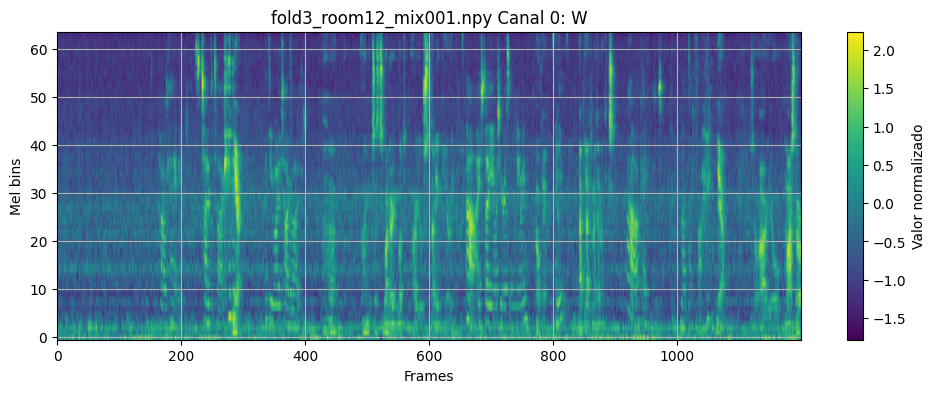

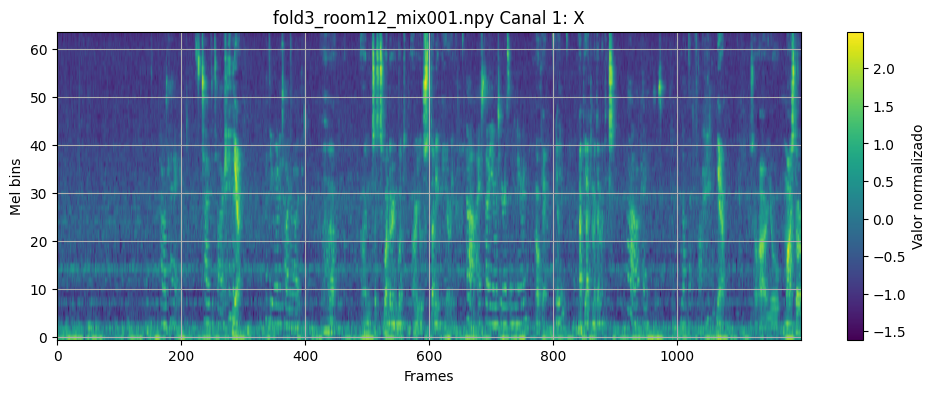

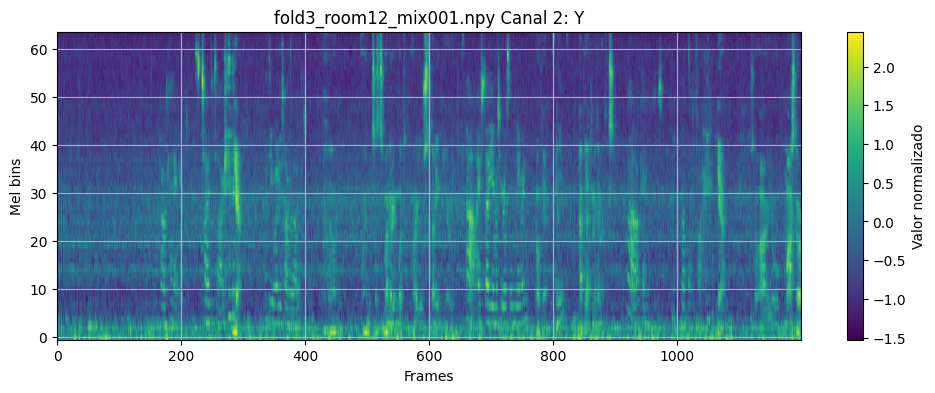

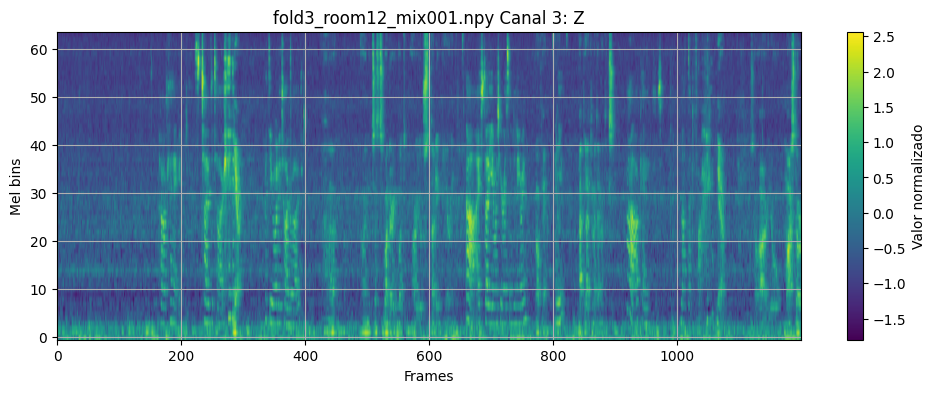

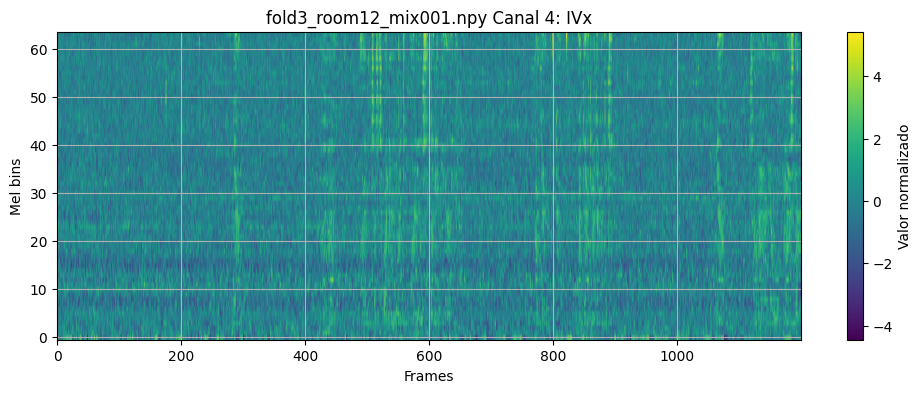

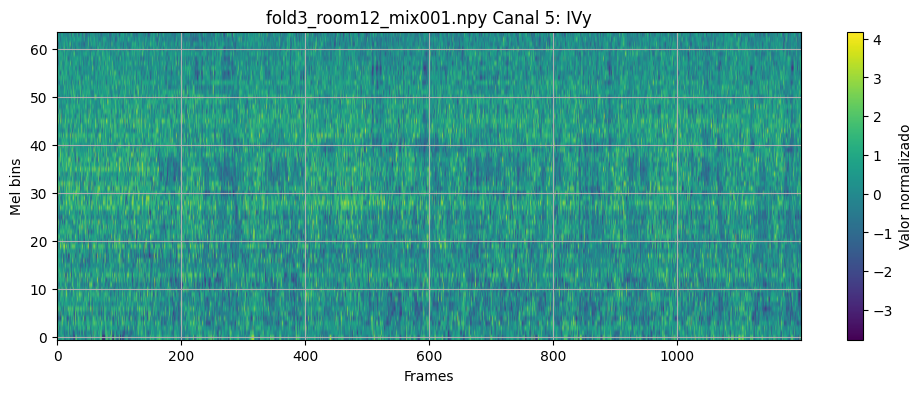

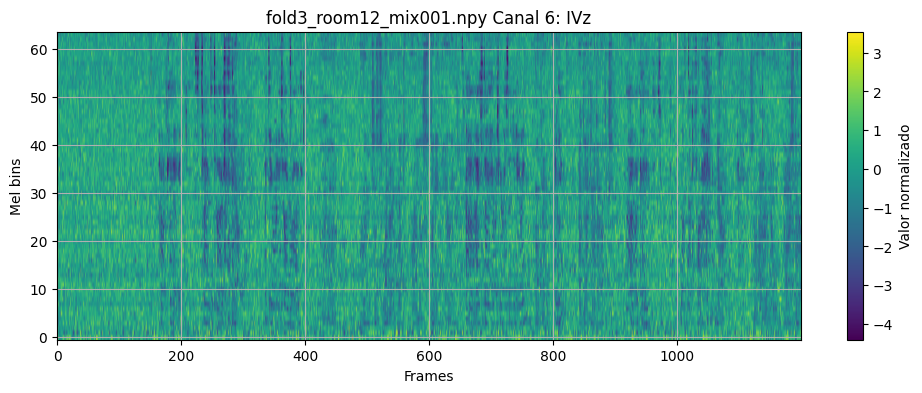

In [ ]:
plot_channels(feat, title_prefix=os.path.basename(sample_file), max_frames=1200, save_dir="/content/drive/MyDrive/TFG/")

## 4. Energía por canal en un archivo

,channel,mean_abs,rms
0,W,0.616167,0.728220
1,X,0.565403,0.675827
2,Y,0.549996,0.660143
3,Z,0.568089,0.674598
4,IVx,0.698722,0.903446
5,IVy,0.798201,0.997547
6,IVz,0.728900,0.941404


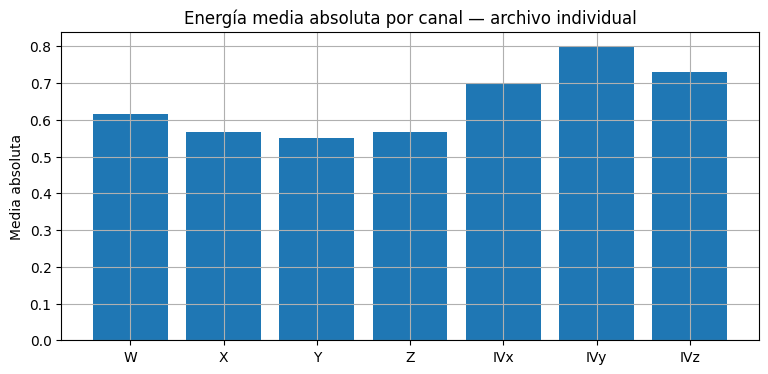

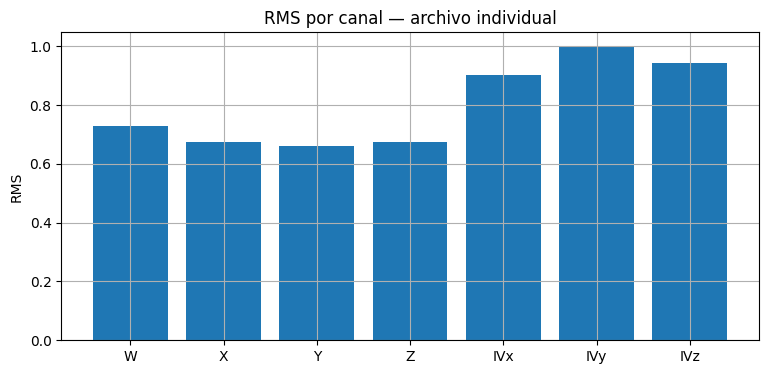

In [ ]:
abs_energy = channel_abs_energy(feat)
rms_energy = channel_rms(feat)

df_one = pd.DataFrame({
    'channel': CHANNEL_NAMES,
    'mean_abs': abs_energy,
    'rms': rms_energy
})
display(df_one)

plot_bar(abs_energy, 'Energía media absoluta por canal — archivo individual', 'Media absoluta')
plot_bar(rms_energy, 'RMS por canal — archivo individual', 'RMS')

## 5. Estadística global de canales en todo el dataset

In [ ]:
global_abs = []
global_rms = []
frame_counts = []
bad_files = []

for path in files:
    try:
        f = load_feature(path)
        global_abs.append(channel_abs_energy(f))
        global_rms.append(channel_rms(f))
        frame_counts.append(f.shape[0])
    except Exception as e:
        print("Saltando archivo con error:", path)
        print("Error:", e)
        bad_files.append(path)

global_abs = np.array(global_abs)
global_rms = np.array(global_rms)

df_global = pd.DataFrame({
    'channel': CHANNEL_NAMES,
    'mean_abs_mean': global_abs.mean(axis=0),
    'mean_abs_std': global_abs.std(axis=0),
    'rms_mean': global_rms.mean(axis=0),
    'rms_std': global_rms.std(axis=0),
})

display(df_global)

print("Archivos procesados:", len(global_abs))
print("Archivos con error:", len(bad_files))
print("Media de frames por archivo:", np.mean(frame_counts))
print("Mínimo/máximo frames:", np.min(frame_counts), np.max(frame_counts))

,channel,mean_abs_mean,mean_abs_std,rms_mean,rms_std
0,W,0.813717,0.287104,0.966403,0.287611
1,X,0.813097,0.284422,0.967185,0.282199
2,Y,0.817407,0.286301,0.968001,0.288355
3,Z,0.815749,0.277390,0.968074,0.279298
4,IVx,0.771978,0.131330,0.985910,0.160587
5,IVy,0.799430,0.105701,1.003770,0.124618
6,IVz,0.795200,0.156331,0.996033,0.175671


Archivos procesados: 168
Archivos con error: 0
Media de frames por archivo: 7894.5952380952385
Mínimo/máximo frames: 1625 28461


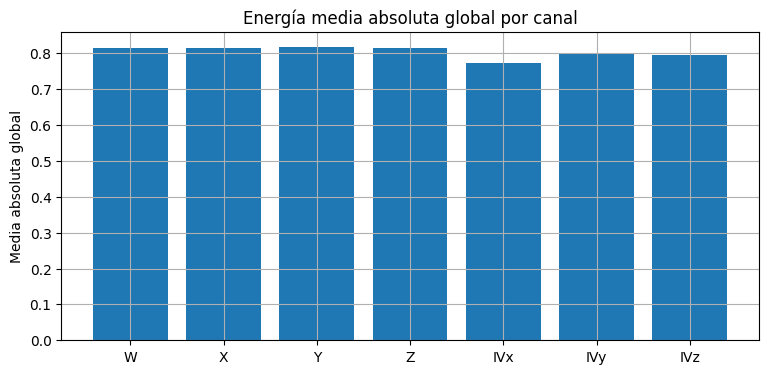

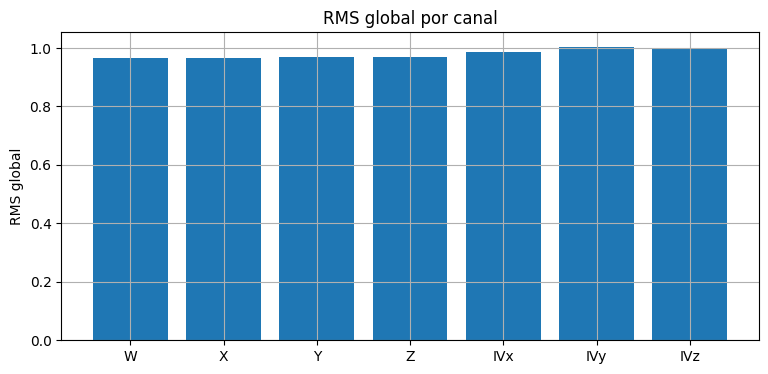

In [ ]:
plot_bar(df_global['mean_abs_mean'].values, 'Energía media absoluta global por canal', 'Media absoluta global')
plot_bar(df_global['rms_mean'].values, 'RMS global por canal', 'RMS global')

## 6. Distribución de energía por archivo y canal

/tmp/ipykernel_3534/1512970538.py:2: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([global_abs[:, i] for i in range(NB_CH)], labels=CHANNEL_NAMES)


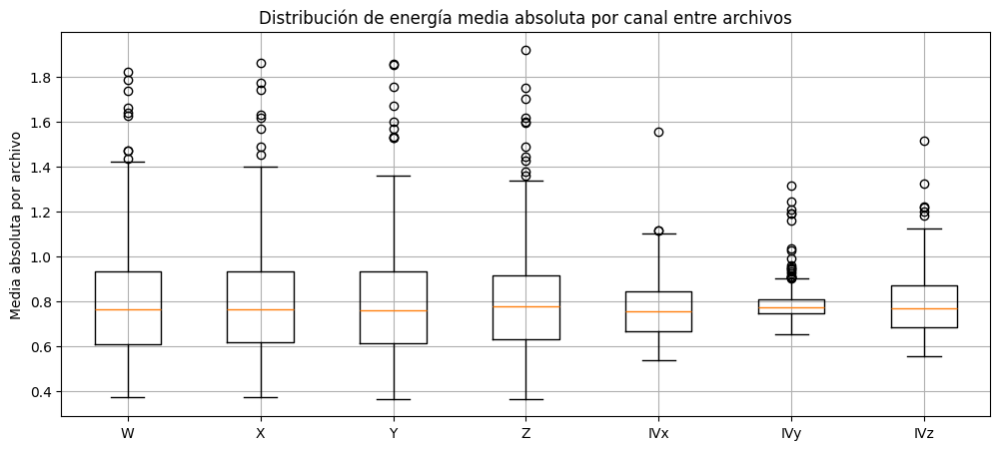

In [ ]:
plt.figure(figsize=(12, 5))
plt.boxplot([global_abs[:, i] for i in range(NB_CH)], labels=CHANNEL_NAMES)
plt.title('Distribución de energía media absoluta por canal entre archivos')
plt.ylabel('Media absoluta por archivo')
plt.show()

## 7. Comparación agregada: WXYZ vs IVs

Energía media WXYZ: 0.8149923058159507
Energía media IVs: 0.7888691275869805
Ratio IVs/WXYZ: 0.9679467179708104


/tmp/ipykernel_3534/514923757.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([wxyz_energy, iv_energy], labels=['WXYZ log-mel', 'IVs'])


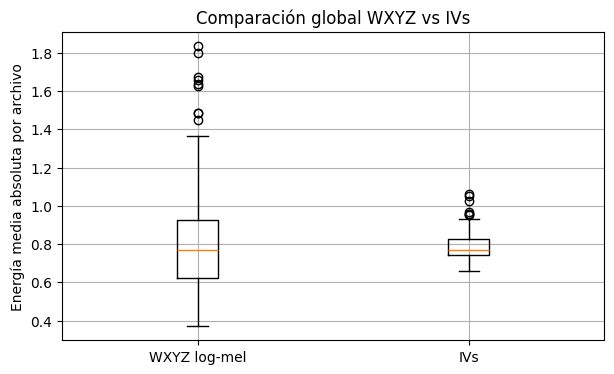

In [ ]:
wxyz_energy = global_abs[:, :4].mean(axis=1)
iv_energy = global_abs[:, 4:].mean(axis=1)

print('Energía media WXYZ:', wxyz_energy.mean())
print('Energía media IVs:', iv_energy.mean())
print('Ratio IVs/WXYZ:', iv_energy.mean() / (wxyz_energy.mean() + 1e-12))

plt.figure(figsize=(7, 4))
plt.boxplot([wxyz_energy, iv_energy], labels=['WXYZ log-mel', 'IVs'])
plt.title('Comparación global WXYZ vs IVs')
plt.ylabel('Energía media absoluta por archivo')
plt.show()

## 8. Visualización de varios archivos aleatorios

Archivo: fold4_room8_mix005.npy shape: (8763, 7, 64)


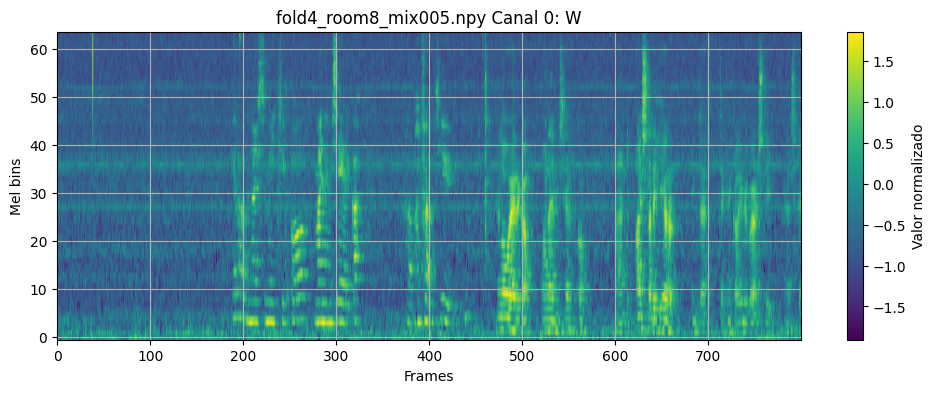

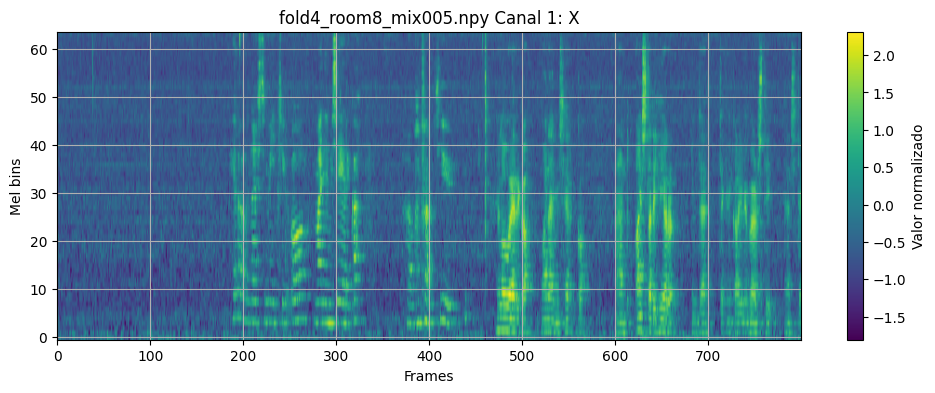

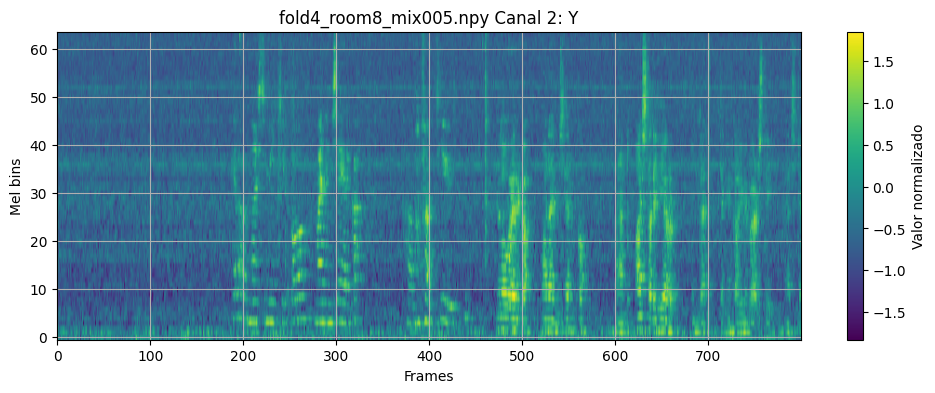

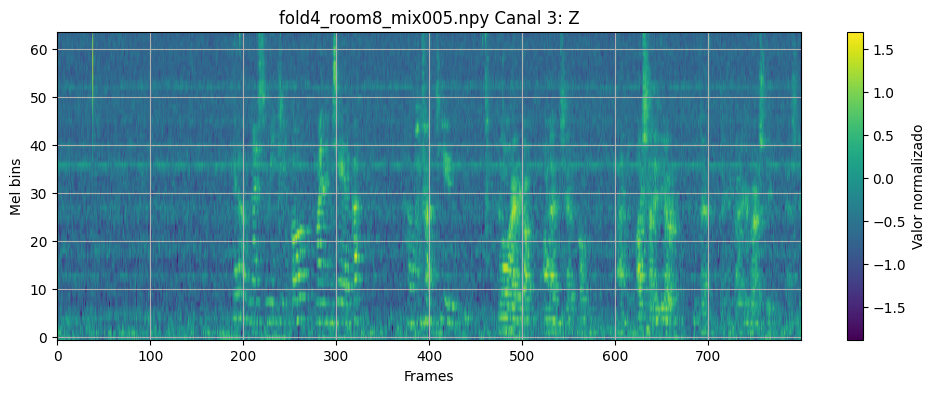

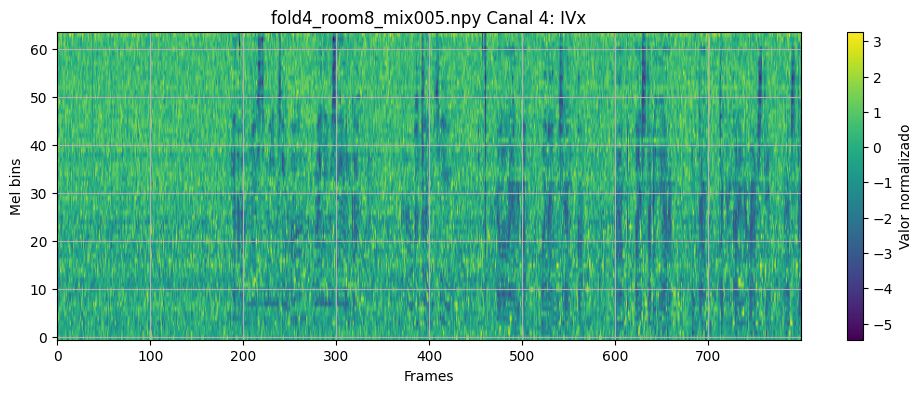

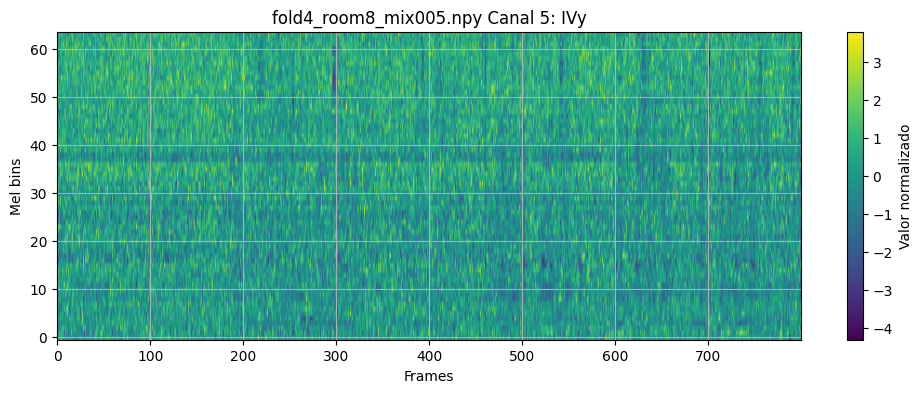

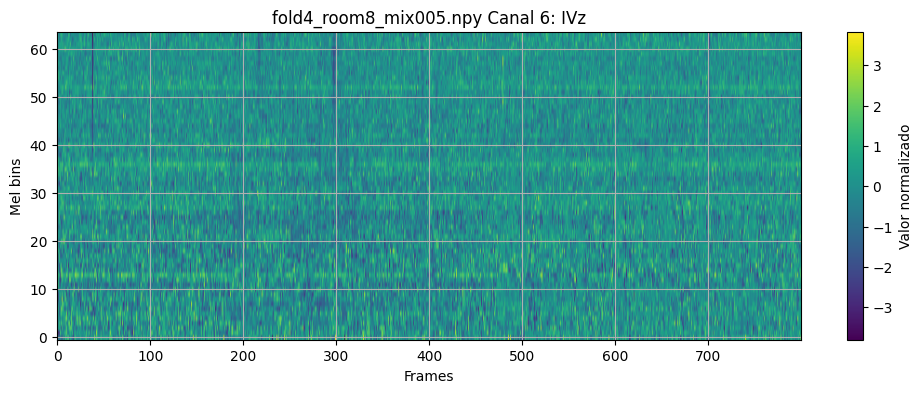

Archivo: fold3_room21_mix006.npy shape: (1895, 7, 64)


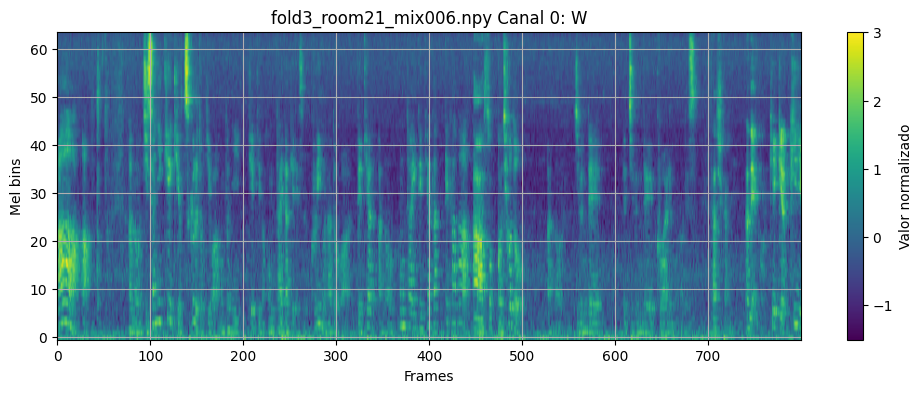

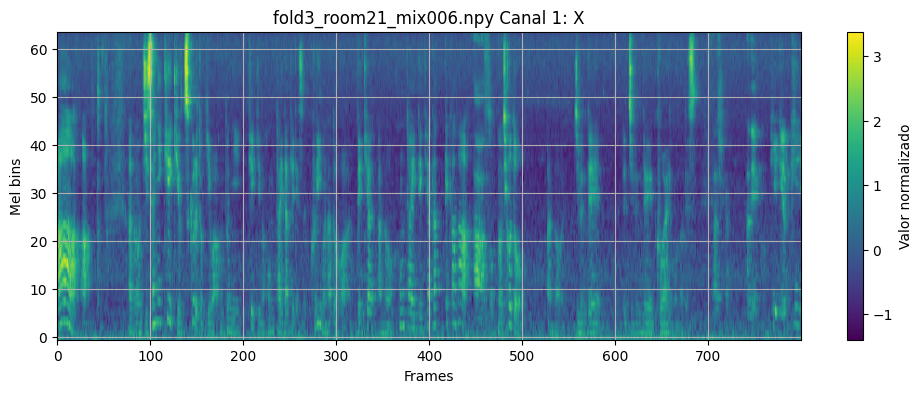

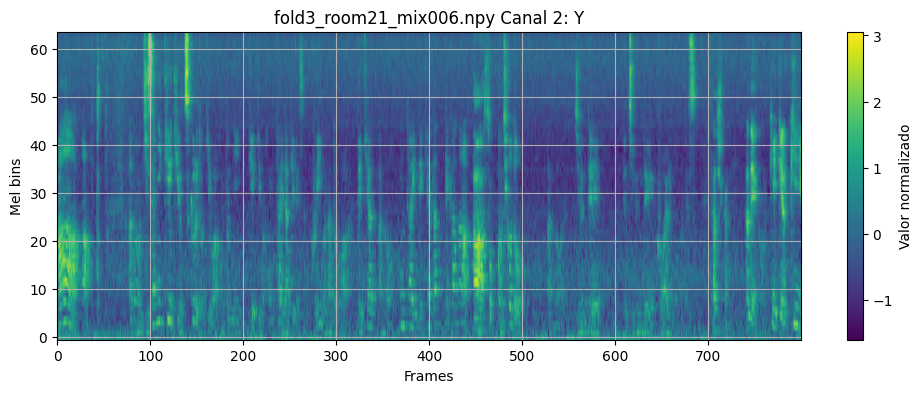

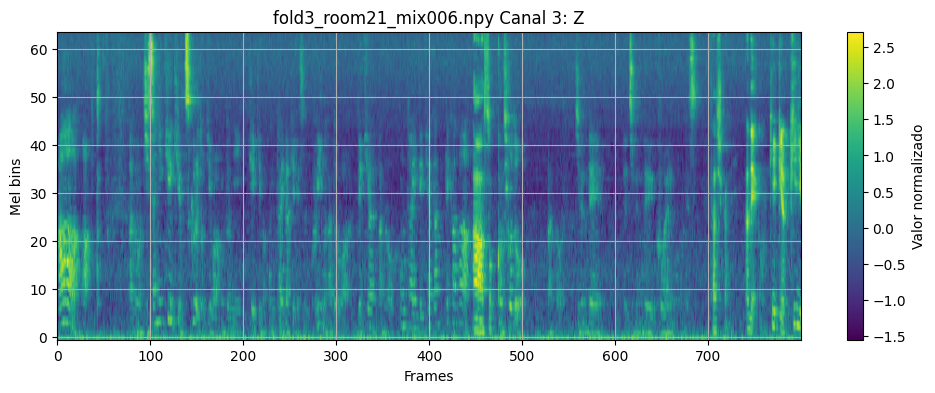

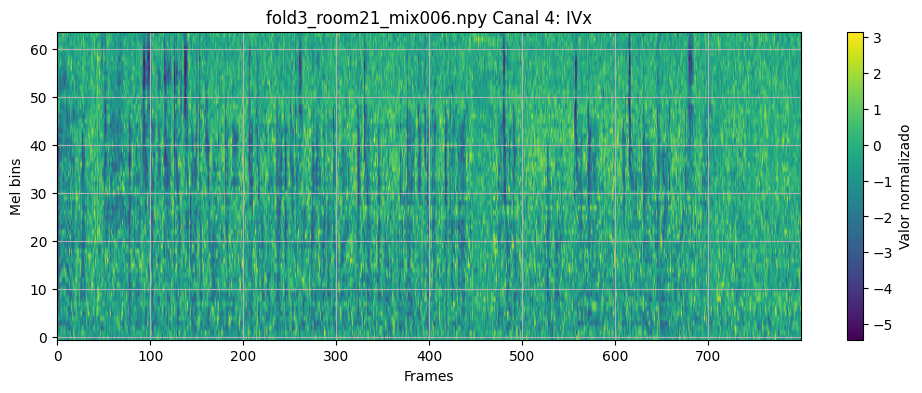

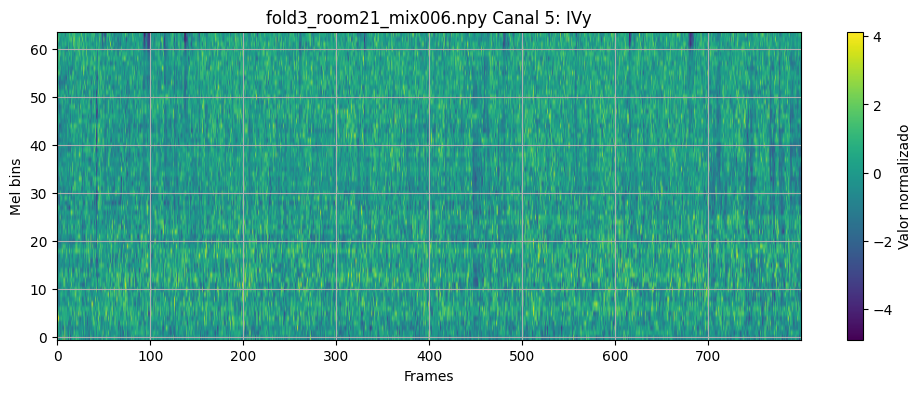

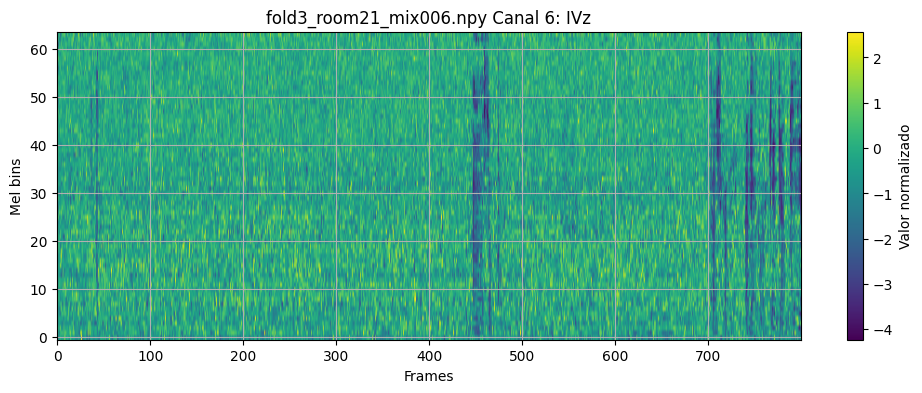

Archivo: fold3_room12_mix007.npy shape: (12437, 7, 64)


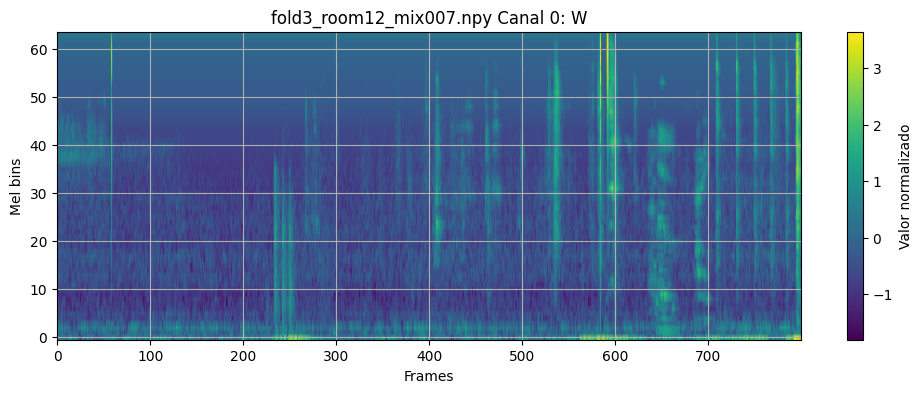

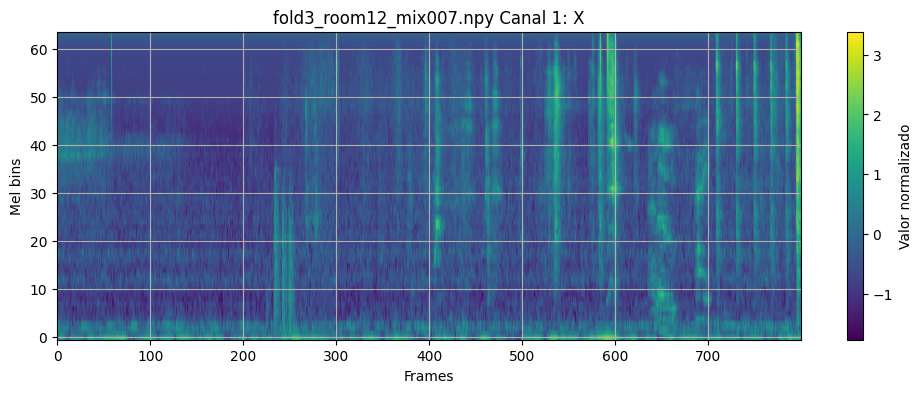

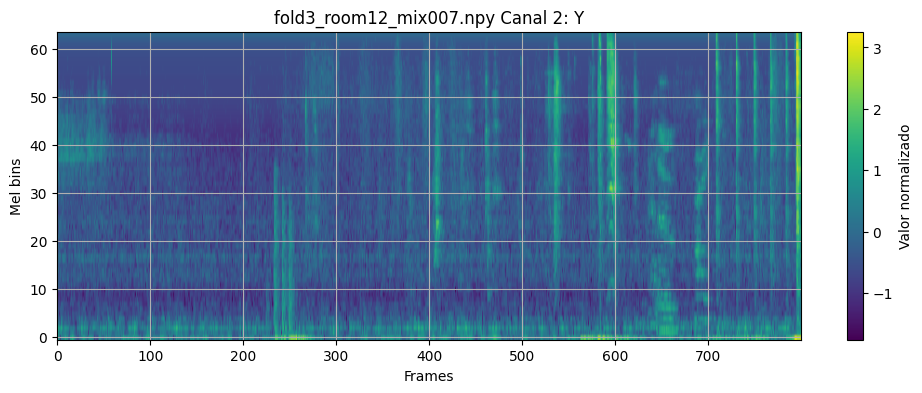

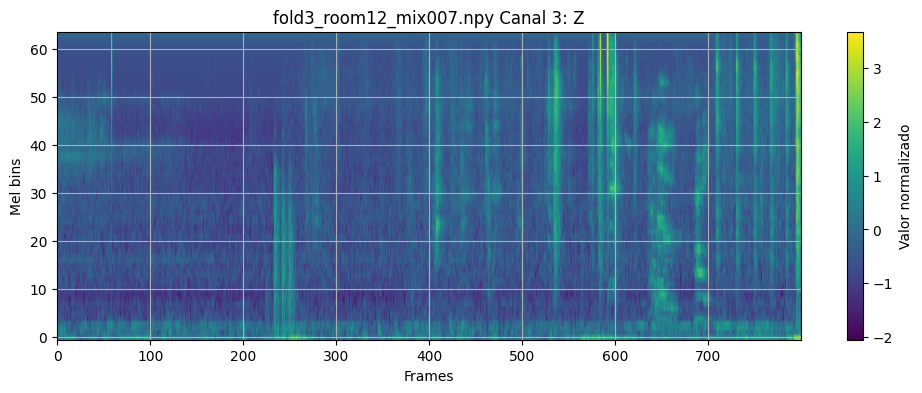

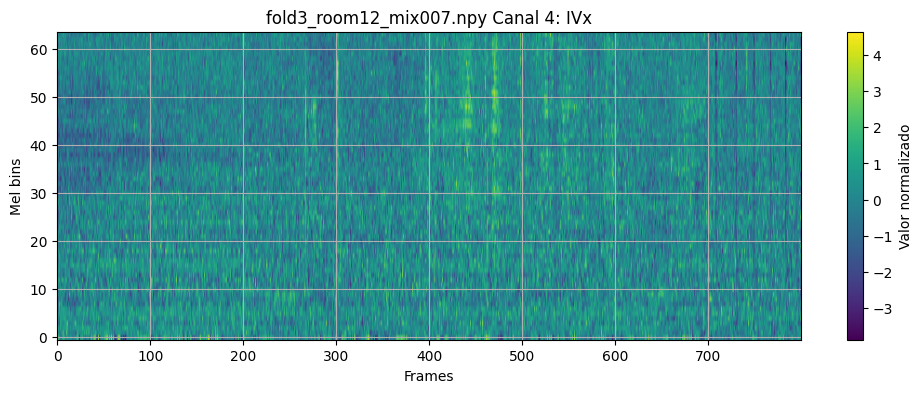

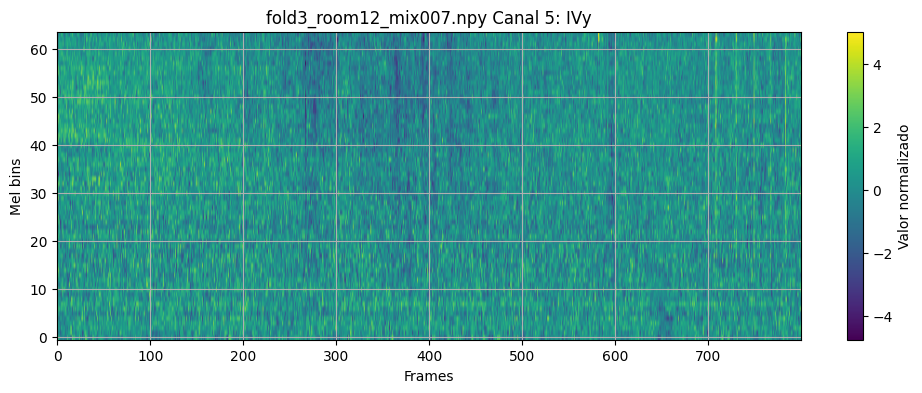

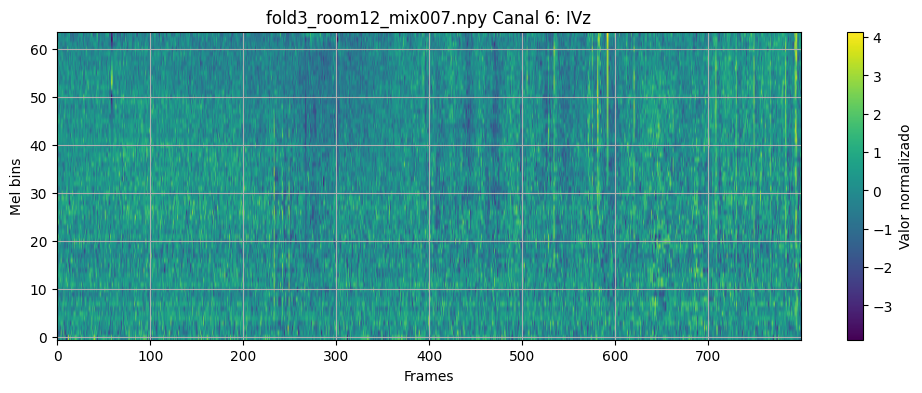

In [ ]:
random.seed(42)
sample_files = random.sample(files, min(3, len(files)))

for path in sample_files:
    f = load_feature(path)
    print('Archivo:', os.path.basename(path), 'shape:', f.shape)
    plot_channels(f, title_prefix=os.path.basename(path), max_frames=800)

## 9. Relación simple con labels: frames activos y distancia media

Esta sección intenta cruzar features con labels ADPIT para obtener una primera relación exploratoria entre energía por canal y distancia de eventos activos.

In [ ]:
def load_label_for_feature(feature_path):
    label_path = os.path.join(LABEL_DIR, os.path.basename(feature_path))
    if not os.path.exists(label_path):
        return None
    return np.load(label_path)

def summarize_active_label_distances(label):
    """Devuelve distancias activas desde label ADPIT [frames, 6, 5, classes]."""
    if label is None or label.ndim != 4:
        return np.array([])
    sed = label[:, :, 0, :] > 0.5
    dist = label[:, :, 4, :]
    return dist[sed]

rows = []
for path in files:
    f = load_feature(path)
    label = load_label_for_feature(path)
    dists = summarize_active_label_distances(label)
    e = channel_abs_energy(f)
    rows.append({
        'file': os.path.basename(path),
        'frames': f.shape[0],
        'num_active_labels': len(dists),
        'mean_dist_label_scaled': np.mean(dists) if len(dists) else np.nan,
        **{f'energy_{name}': e[i] for i, name in enumerate(CHANNEL_NAMES)}
    })

df_files = pd.DataFrame(rows)
display(df_files.head())
print('Archivos con labels activos:', df_files['num_active_labels'].gt(0).sum())

,file,frames,num_active_labels,mean_dist_label_scaled,energy_W,energy_X,energy_Y,energy_Z,energy_IVx,energy_IVy,energy_IVz
0,fold3_room12_mix001.npy,12664,2032,1.229889,0.616167,0.565403,0.549996,0.568089,0.698722,0.798201,0.728900
1,fold3_room12_mix002.npy,11235,1829,1.178265,0.722687,0.665879,0.651132,0.669458,0.619815,0.754377,0.796037
2,fold3_room12_mix003.npy,17739,5197,1.174941,1.637539,1.630886,1.753797,1.618543,0.659394,1.035906,0.707527
3,fold3_room12_mix004.npy,16757,5204,1.282954,1.472423,1.452822,1.532434,1.487379,0.645705,0.905551,0.764333
4,fold3_room12_mix005.npy,4742,1538,1.285715,1.659766,1.771826,1.669840,1.593099,0.889030,0.704730,0.799286


Archivos con labels activos: 168


,mean_dist_label_scaled
mean_dist_label_scaled,1.000000
energy_IVz,0.134722
energy_Y,0.081130
energy_Z,0.081117
energy_W,0.059738
energy_X,0.030699
energy_IVx,0.012423
energy_IVy,-0.217704


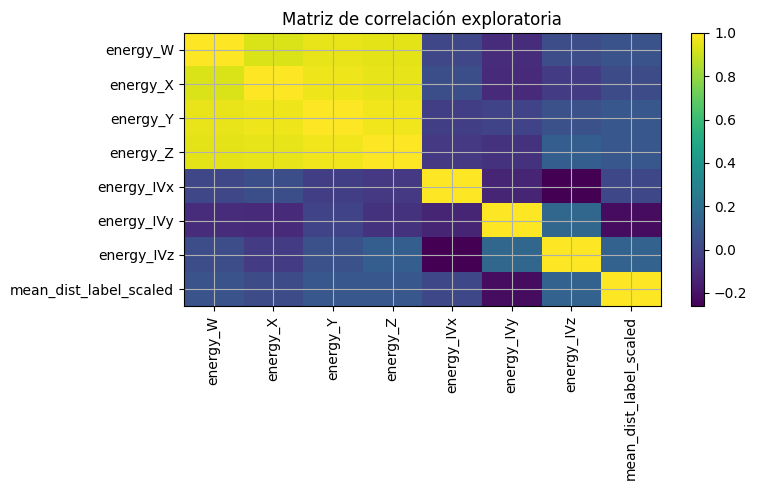

In [ ]:
# Correlación exploratoria: energía por canal vs distancia media del archivo
corr_cols = [f'energy_{name}' for name in CHANNEL_NAMES] + ['mean_dist_label_scaled']
df_corr = df_files[corr_cols].dropna().corr()
display(df_corr[['mean_dist_label_scaled']].sort_values('mean_dist_label_scaled', ascending=False))

plt.figure(figsize=(8, 5))
plt.imshow(df_corr.values, aspect='auto')
plt.xticks(range(len(df_corr.columns)), df_corr.columns, rotation=90)
plt.yticks(range(len(df_corr.index)), df_corr.index)
plt.title('Matriz de correlación exploratoria')
plt.colorbar()
plt.tight_layout()
plt.show()

## 10. Espacio para conclusiones

Completar después de ejecutar:

- ¿W tiene más energía que X/Y/Z?
- ¿Los IVs tienen una escala/distribución distinta?
- ¿La energía de W se relaciona más con distancia que IVs?
- ¿Los IVs explican por qué IV-only conserva buen AE?
- ¿Qué justifica el colapso de WXYZ-only?